In [3]:
import pyspark
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
from pyspark.sql.types import *
import pandas as pd
import geopandas 
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creation of the Session

In [4]:
spark = SparkSession \
    .builder \
    .master('spark://anthony-Latitude-3510:7077') \
    .appName("1") \
    .getOrCreate()

22/12/04 23:48:57 WARN Utils: Your hostname, anthony-Latitude-3510 resolves to a loopback address: 127.0.1.1; using 138.250.205.84 instead (on interface wlp0s20f3)
22/12/04 23:48:57 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address


Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


22/12/04 23:48:58 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


# Design of the initial dataframe 

## Creation of the dataset

#### Reading the source file only once

In [5]:
path = "data/dataFiles/"

#### Creation of the dataframe 

In [6]:
datasDF = spark.read.json(path)

In [7]:
datasDF.printSchema()

root
 |-- _corrupt_record: string (nullable = true)
 |-- id: long (nullable = true)
 |-- location: struct (nullable = true)
 |    |-- altitude: string (nullable = true)
 |    |-- country: string (nullable = true)
 |    |-- exact_location: long (nullable = true)
 |    |-- id: long (nullable = true)
 |    |-- indoor: long (nullable = true)
 |    |-- latitude: string (nullable = true)
 |    |-- longitude: string (nullable = true)
 |-- sampling_rate: double (nullable = true)
 |-- sensor: struct (nullable = true)
 |    |-- id: long (nullable = true)
 |    |-- pin: string (nullable = true)
 |    |-- sensor_type: struct (nullable = true)
 |    |    |-- id: long (nullable = true)
 |    |    |-- manufacturer: string (nullable = true)
 |    |    |-- name: string (nullable = true)
 |-- sensordatavalues: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- id: long (nullable = true)
 |    |    |-- value: string (nullable = true)
 |    |    |-- value_type: string (

#### Collect all the elements needed and create a new dataframe 

In [8]:
datasDF.createOrReplaceTempView("sensors")

In [9]:
# Selecting datas by using an SQL expression 
sensorsDF = spark.sql("SELECT location.country, DOUBLE(location.latitude), DOUBLE(location.longitude), sensor.id,CAST(timestamp AS DATE), DOUBLE(sensordatavalues.value[0]), DOUBLE(sensordatavalues.value[1]) \
                        FROM sensors \
                         WHERE sensordatavalues.value_type[0]='P1' AND sensordatavalues.value_type[1]='P2' ")

# Header renaming
sensorsDF = sensorsDF.withColumnRenamed("sensordatavalues.value[0]", "P1")
sensorsDF = sensorsDF.withColumnRenamed("sensordatavalues.value[1]", "P2")
sensorsDF = sensorsDF.withColumnRenamed("location.latitude", "latitude")
sensorsDF = sensorsDF.withColumnRenamed("location.longitude", "longitude")
sensorsDF = sensorsDF.withColumnRenamed("timestamp", "date")

# removing identical lines (due to the delay during each data recovery)
sensorsDF = sensorsDF.distinct()

In [10]:
sensorsDF.show()

+-------+--------+---------+-----+----------+------+-----+
|country|latitude|longitude|   id|      date|    P1|   P2|
+-------+--------+---------+-----+----------+------+-----+
|     FR|  48.838|    2.322|  819|2022-11-15|  8.15| 6.85|
|     DE|  51.114|    6.542| 1404|2022-11-15|  9.31| 7.14|
|     DE|  51.664|    7.626| 2362|2022-11-15|   3.2| 2.26|
|     DE|  51.728|    8.794| 4506|2022-11-15|1999.9|999.9|
|     DE|  48.768|    9.154| 4837|2022-11-15|  4.08| 2.81|
|     DE|   49.36|    8.266| 6640|2022-11-15| 12.05| 8.27|
|     DE|  52.284|    8.032| 7621|2022-11-15| 10.38|  8.1|
|     DE|  48.678|     9.28| 8708|2022-11-15|  11.6| 5.15|
|     DE|  48.024|   11.726| 9536|2022-11-15|   4.5| 3.28|
|     DE|   53.56|   10.062| 9972|2022-11-15| 18.73|16.27|
|     DE|  51.146|    7.008|12306|2022-11-15|  5.47| 4.15|
|     BE|  50.998|     4.25|13592|2022-11-15| 17.53| 9.25|
|     NL|  52.116|    5.286|13816|2022-11-15| 14.39|12.16|
|     NL|  51.978|     5.33|14187|2022-11-15| 60.19|55.9

## Fisrt dataset exploration

#### Total number of values

In [11]:
sensorsDF.count()

254290

#### Number of countries

In [12]:
sensorsDF.dropDuplicates(['country']).select("country").count()

80

#### List of countries 

In [13]:
sensorsDF.dropDuplicates(['country']).select("country").show()

+-------+
|country|
+-------+
|     LT|
|     FI|
|     AZ|
|     UA|
|     RO|
|     NL|
|     PL|
|     MK|
|     MX|
|     EE|
|     CN|
|     AT|
|     RU|
|     AD|
|     HR|
|     CZ|
|     NP|
|     PT|
|     HK|
|     LR|
+-------+
only showing top 20 rows



#### Sensors per country

In [14]:
sensorsDF.dropDuplicates(['latitude','longitude']).groupBy("country").agg(F.count("P1")).orderBy(F.col("count(P1)").desc()).show(100)

+-------+---------+
|country|count(P1)|
+-------+---------+
|     DE|     5333|
|     NL|     1821|
|     PL|     1009|
|     BG|      806|
|     BE|      703|
|     RU|      527|
|     IT|      471|
|     FR|      393|
|     GB|      385|
|     AT|      319|
|     HU|      292|
|     SE|      181|
|     CH|      147|
|     RS|      125|
|     RO|       95|
|     ES|       84|
|     CZ|       76|
|     US|       74|
|     UA|       64|
|     SK|       63|
|     AU|       59|
|     IE|       52|
|     PT|       27|
|     LV|       26|
|     SI|       23|
|     CA|       23|
|     NO|       20|
|     LU|       20|
|     BA|       17|
|     GR|       17|
|     MK|       17|
|     FI|       16|
|     MX|       16|
|     AR|       15|
|     TH|       14|
|     HR|       12|
|     KG|       10|
|     AL|        9|
|     BR|        7|
|     ZA|        7|
|     JP|        6|
|     BY|        5|
|     IL|        5|
|     NZ|        5|
|     PK|        4|
|     IS|        4|
|     TR|        4|


## Dataset cleaning

### Summary

In [15]:
sensorsDF.summary().show()

+-------+-------+-----------------+------------------+-----------------+------------------+------------------+
|summary|country|         latitude|         longitude|               id|                P1|                P2|
+-------+-------+-----------------+------------------+-----------------+------------------+------------------+
|  count| 254290|           254290|            254290|           254290|            254290|            254290|
|   mean|   null|49.15272521632871|11.795066597366494|39193.35730465217|36.401835424121984|20.234709544221243|
| stddev|   null| 8.43065443452895|   18.974653675591|22805.63949780509|1386.1366546627635|102.16717301043009|
|    min|     AD|          -46.434|          -149.532|               92|        -692714.73|              -1.0|
|    25%|   null|           48.164|             6.466|            18879|              6.33|              2.68|
|    50%|   null|           50.866|     9.37223553112|            39824|             12.51|              5.96|
|

#### Scattering 

<AxesSubplot:xlabel='P1', ylabel='P2'>

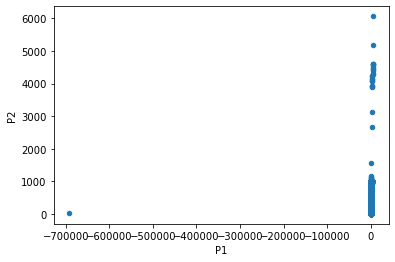

In [16]:
# Transforming the pyspark sql Dataframe to Pandas dataframe
sensorsDf = sensorsDF.toPandas()

# Apply of the plot Pandas function
sensorsDf.plot.scatter('P1','P2')

In [17]:
sensorsDF = sensorsDF.where(sensorsDF.P1>0)

<AxesSubplot:xlabel='P1', ylabel='P2'>

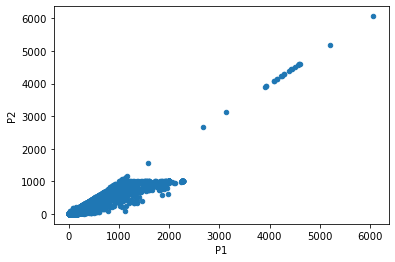

In [18]:
sensorsDf = sensorsDF.toPandas()
sensorsDf.plot.scatter('P1','P2')

## Dataframe Preparation

### Conversion of P1 and P2 in AQI

In [19]:
# Application of conversion rules
sensorsDF = sensorsDF.withColumn('AQI1', 
                                 F.when((sensorsDF.P1 <= 16),1).
                                 when((sensorsDF.P1 < 33),2).
                                 when((sensorsDF.P1 < 50),3).
                                 when((sensorsDF.P1 < 58),4).
                                 when((sensorsDF.P1 < 66),5).
                                 when((sensorsDF.P1 < 75),6).
                                 when((sensorsDF.P1 < 83),7).
                                 when((sensorsDF.P1 < 91),8).
                                 when((sensorsDF.P1 < 100),9).
                                 when((sensorsDF.P1 > 100),10))

sensorsDF = sensorsDF.withColumn('AQI2', 
                                 F.when((sensorsDF.P2 <= 11),1).
                                 when((sensorsDF.P2 < 23),2).
                                 when((sensorsDF.P2 < 35),3).
                                 when((sensorsDF.P2 < 41),4).
                                 when((sensorsDF.P2 < 47),5).
                                 when((sensorsDF.P2 < 53),6).
                                 when((sensorsDF.P2 < 58),7).
                                 when((sensorsDF.P2 < 64),8).
                                 when((sensorsDF.P2 < 70),9).
                                 when((sensorsDF.P2 > 70),10))

# Add a final AQI column
sensorsDF = sensorsDF.withColumn('AQI', 
                                 F.when((sensorsDF.AQI1 <= sensorsDF.AQI2),sensorsDF.AQI2). # keep only the biggest AQI 
                                 otherwise(sensorsDF.AQI1))
sensorsDF = sensorsDF.drop("AQI1", "AQI2", "P1", "P2") 

In [20]:
sensorsDF.show()

+-------+--------------+--------------+-----+----------+---+
|country|      latitude|     longitude|   id|      date|AQI|
+-------+--------------+--------------+-----+----------+---+
|     AT|          47.0|        16.084| 1593|2022-11-14|  3|
|     DE|        50.812|         7.738| 3845|2022-11-14|  1|
|     DE|        51.594|         9.928| 5257|2022-11-14|  2|
|     BG|        43.214|        27.906| 6199|2022-11-14|  4|
|     DE|         51.46|        11.868| 6358|2022-11-14|  4|
|     BG|        43.272|        26.932| 7965|2022-11-14|  2|
|     DE|         51.36|          7.34| 8036|2022-11-14|  1|
|     SE|        59.622|        16.556|11004|2022-11-14|  1|
|     DE|        53.882|        10.642|15925|2022-11-14|  1|
|     DE|        51.344|         7.022|16654|2022-11-14|  1|
|     DE|        52.654|        10.326|16673|2022-11-14|  2|
|     FR|        48.108|        -1.706|16824|2022-11-14|  2|
|     FR|         48.12|        -1.456|16870|2022-11-14|  2|
|     SE|        58.014|

### Conversion of the alpha2 country code into alpha3 country code

In [21]:
path = "data/country-code.json"
countryCodeDF = spark.read.json(path, multiLine=True) # JSON file including informations about coutries

In [22]:
countryCodeDF.printSchema()

root
 |-- alpha2Code: string (nullable = true)
 |-- alpha3Code: string (nullable = true)
 |-- englishShortName: string (nullable = true)
 |-- frenchShortName: string (nullable = true)
 |-- numeric: long (nullable = true)



In [23]:
# Extraction of the needed datas
countryCodeDF.createOrReplaceTempView("country")
countryCodeDF = spark.sql("SELECT alpha2Code as country, alpha3Code FROM country")

In [24]:
countryCodeDF.show()

+-------+----------+
|country|alpha3Code|
+-------+----------+
|     AF|       AFG|
|     AL|       ALB|
|     DZ|       DZA|
|     AS|       ASM|
|     AD|       AND|
|     AO|       AGO|
|     AI|       AIA|
|     AQ|       ATA|
|     AG|       ATG|
|     AR|       ARG|
|     AM|       ARM|
|     AW|       ABW|
|     AU|       AUS|
|     AT|       AUT|
|     AZ|       AZE|
|     BS|       BHS|
|     BH|       BHR|
|     BD|       BGD|
|     BB|       BRB|
|     BY|       BLR|
+-------+----------+
only showing top 20 rows



In [25]:
# Apply of a join transformation to join the two dataframes by the same country code
sensorsDF = sensorsDF.join(countryCodeDF, on="country")

In [26]:
sensorsDF = sensorsDF.drop("country")
sensorsDF = sensorsDF.withColumnRenamed("alpha3Code", "country")

sensorsDF.show()

+--------+---------+-----+----------+---+-------+
|latitude|longitude|   id|      date|AQI|country|
+--------+---------+-----+----------+---+-------+
|  48.838|    2.322|  819|2022-11-15|  1|    FRA|
|  51.114|    6.542| 1404|2022-11-15|  1|    DEU|
|  51.664|    7.626| 2362|2022-11-15|  1|    DEU|
|  51.728|    8.794| 4506|2022-11-15| 10|    DEU|
|  48.768|    9.154| 4837|2022-11-15|  1|    DEU|
|   49.36|    8.266| 6640|2022-11-15|  1|    DEU|
|  52.284|    8.032| 7621|2022-11-15|  1|    DEU|
|  48.678|     9.28| 8708|2022-11-15|  1|    DEU|
|  48.024|   11.726| 9536|2022-11-15|  1|    DEU|
|   53.56|   10.062| 9972|2022-11-15|  2|    DEU|
|  51.146|    7.008|12306|2022-11-15|  1|    DEU|
|  50.998|     4.25|13592|2022-11-15|  2|    BEL|
|  52.116|    5.286|13816|2022-11-15|  2|    NLD|
|  51.978|     5.33|14187|2022-11-15|  7|    NLD|
|  51.678|    6.074|17618|2022-11-15|  2|    DEU|
|    48.7|    9.316|17949|2022-11-15|  1|    DEU|
|  48.406|    9.984|17993|2022-11-15|  1|    DEU|


# 1. Top 10 countries with highest average AQI improvement over the previous 24h 

## Computing of the average AQI per country per day 

In [27]:
sensorsDF1 = sensorsDF.filter((F.col("date") == "2022-11-25") | (F.col("date") == "2022-11-26")) \
                      .groupBy("country","date") \
                      .agg(F.avg("AQI"))

In [28]:
sensorsDF1.show()

+-------+----------+------------------+
|country|      date|          avg(AQI)|
+-------+----------+------------------+
|    IND|2022-11-26|              10.0|
|    LBR|2022-11-25|               2.0|
|    KOR|2022-11-25|               3.0|
|    ITA|2022-11-26| 3.150943396226415|
|    ROU|2022-11-26|2.9012345679012346|
|    LUX|2022-11-26|2.1666666666666665|
|    BIH|2022-11-25| 5.235294117647059|
|    ITA|2022-11-25|1.9680365296803652|
|    ARG|2022-11-26|               2.0|
|    BEN|2022-11-26|               1.0|
|    ALA|2022-11-25|               2.0|
|    SGP|2022-11-26|               2.0|
|    POL|2022-11-25|  6.70682302771855|
|    MKD|2022-11-26| 2.769230769230769|
|    DEU|2022-11-25|1.7655145326001571|
|    SAU|2022-11-25|              10.0|
|    TWN|2022-11-26|               2.0|
|    GBR|2022-11-25|1.3532763532763532|
|    ALA|2022-11-26|               2.0|
|    KEN|2022-11-25|               2.0|
+-------+----------+------------------+
only showing top 20 rows



## Ranking of the worst average AQI per country in the last 24h

In [29]:
sensorsDF1forDay = sensorsDF1.filter(F.col("date") == "2022-11-26") \
                             .orderBy(F.col("avg(AQI)").desc())

In [30]:
sensorsDF1forDay.show()

+-------+----------+------------------+
|country|      date|          avg(AQI)|
+-------+----------+------------------+
|    IND|2022-11-26|              10.0|
|    SAU|2022-11-26|               8.0|
|    POL|2022-11-26| 6.596529284164859|
|    PAK|2022-11-26|               6.5|
|    SRB|2022-11-26| 6.319327731092437|
|    BIH|2022-11-26| 5.470588235294118|
|    KGZ|2022-11-26| 5.111111111111111|
|    CHN|2022-11-26|               5.0|
|    VNM|2022-11-26|               4.4|
|    HRV|2022-11-26| 4.363636363636363|
|    NPL|2022-11-26|               4.0|
|    IDN|2022-11-26|               4.0|
|    ALB|2022-11-26|               4.0|
|    HUN|2022-11-26| 3.653225806451613|
|    ITA|2022-11-26| 3.150943396226415|
|    SVN|2022-11-26|3.0588235294117645|
|    AZE|2022-11-26|               3.0|
|    KAZ|2022-11-26|               3.0|
|    ROU|2022-11-26|2.9012345679012346|
|    SVK|2022-11-26|2.8421052631578947|
+-------+----------+------------------+
only showing top 20 rows



### Map showing the average AQI per country in the last 24h

In [31]:
import folium
from folium import Choropleth

url = (
    "https://raw.githubusercontent.com/python-visualization/folium/main/examples/data"
)
state_geo = f"{url}/world-countries.json" # geojson including the datas describing the geometry of each country of the world 
sensorsDf1 = sensorsDF1.toPandas() # convertion of the Spark SQL dataframe in Pandas dataframe only fromat supported by the library Folium

m = folium.Map(location=[20,0], zoom_start=2.25) # creation of the map

folium.Choropleth( #add of the Choropleth map specifications
    geo_data=state_geo,
    name="choropleth",
    data=sensorsDf1,
    columns=["country","avg(AQI)"],
    key_on="feature.id",
    line_opacity=.1,
    fill_color="BuPu",
    fill_opacity=0.7,
    legend_name="Average Air Quality Index",
    nan_fill_color="#ededed"
).add_to(m)

folium.LayerControl().add_to(m)

m

## Ranking the countries in terms of highest air quality improvement during the last 24h 

In [32]:
sensorsDF1 = sensorsDF1.withColumn("avg(AQI)", F.when((F.col("date") == "2022-11-26"), - sensorsDF1["avg(AQI)"]).otherwise(sensorsDF1["avg(AQI)"])) \
                       .orderBy("date") \
                       .groupBy("country") \
                       .agg(F.sum("avg(AQI)")) \
                       .orderBy(F.col("sum(avg(AQI))").desc())

In [33]:
sensorsDF1 = sensorsDF1.withColumnRenamed("sum(avg(AQI))", "AQIimprov")
sensorsDF1.show()

+-------+-------------------+
|country|          AQIimprov|
+-------+-------------------+
|    SAU|                2.0|
|    KOR|                2.0|
|    UKR| 1.6168656141701963|
|    ZAF|                1.0|
|    BEN|                1.0|
|    PHL|                1.0|
|    EST| 0.6666666666666667|
|    TWN|                0.5|
|    CAN|0.47058823529411753|
|    PRT| 0.4703557312252964|
|    NOR| 0.4117647058823528|
|    NPL|0.33333333333333304|
|    DNK|               0.25|
|    ISL|               0.25|
|    THA|0.23333333333333317|
|    ISR|0.16666666666666674|
|    CZE|0.16637416637416624|
|    RUS|0.11241172714296455|
|    POL|0.11029374355369104|
|    ESP|0.10474308300395263|
+-------+-------------------+
only showing top 20 rows



### Top 10 Bar Chart

#### Conversion of the country code into country name for a better comprehension

In [34]:
path = "data/country-code.json"
countryCodeDF = spark.read.json(path, multiLine=True) # JSON file including informations about coutries

# Extraction of the needed datas
countryCodeDF.createOrReplaceTempView("country")
countryCodeDF1 = spark.sql("SELECT alpha3Code as country, englishShortName FROM country")

# Apply of a join transformation to join the two dataframes by the same country code
sensorsDF1 = sensorsDF1.join(countryCodeDF1, on="country")

sensorsDF1 = sensorsDF1.drop("country")
sensorsDF1 = sensorsDF1.withColumnRenamed("englishShortName", "country")
sensorsDF1.show()

+--------------------+--------------------+
|           AQIimprov|             country|
+--------------------+--------------------+
| 0.11029374355369104|              Poland|
|-0.45849802371541504|              Latvia|
|-0.16666666666666674|              Brazil|
| -0.1388673640707736|              France|
|                 0.0|Congo (the Democr...|
| -1.1829068665460498|               Italy|
|  1.6168656141701963|             Ukraine|
| -0.3636363636363633|             Croatia|
|-0.14245014245014254|United Kingdom of...|
| 0.33333333333333304|               Nepal|
|                -1.0|          Azerbaijan|
|-0.01923076923076...|           Australia|
|                 0.0|               Malta|
|-0.11029411764705888|              Mexico|
|               -0.25|             Belarus|
| -0.8063909774436091|            Slovakia|
| -1.3076375711574952|             Hungary|
|               -0.25|         New Zealand|
| 0.23333333333333317|            Thailand|
|  0.4117647058823528|          

In [35]:
# Order from the better to the worst AQI improvement
sensorsDF1 = sensorsDF1.orderBy(F.col("AQIimprov").desc())

# convertion of the Spark SQL dataframe in Pandas dataframe only fromat supported by the library matplotlib
improvedDf=sensorsDF1.toPandas()

Text(0.5, 1.0, 'Top 10 AQI improvement during the last 24h')

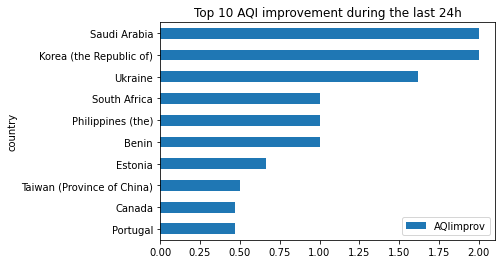

In [36]:
# Keep only the 10 first rows
top10=improvedDf.head(10)

# Display the graph
top10['country'].astype(str)
ax=top10.plot.barh(x='country')  
ax.invert_yaxis()
ax.set_title('Top 10 AQI improvement during the last 24h')

# 2. Top 50 regions based on average AQI improvement over the previous 24h

In [37]:
sensorsDF2 = sensorsDF

## Clustering with K-Means 

### Training dataset

In [38]:
# number of rows before data selection
sensorsDF2.count()

253288

In [39]:
# Keeping only one value for each sensors by keeping only one value with the same positon
trainingData = sensorsDF2.dropDuplicates(['latitude', 'longitude'])
trainingData.count()

13433

In [40]:
from pyspark.ml.feature import VectorAssembler

# We create a vector containing latitude and longitude using by the K-means algorithm
assembler = VectorAssembler().setInputCols(['latitude','longitude']).setOutputCol("GeocCoordinates")

trainingData = assembler.transform(trainingData)

In [41]:
trainingData.show()

+---------------+---------------+-----+----------+---+-------+--------------------+
|       latitude|      longitude|   id|      date|AQI|country|     GeocCoordinates|
+---------------+---------------+-----+----------+---+-------+--------------------+
|        -43.152|        172.732|65825|2022-11-10|  1|    NZL|   [-43.152,172.732]|
|         -37.98|        -63.602|59960|2022-11-19|  1|    ARG|    [-37.98,-63.602]|
|-34.93172624107|138.59428882599|43439|2022-11-16|  1|    AUS|[-34.93172624107,...|
|     -34.578739|     -58.526125|68271|2022-11-22|  1|    ARG|[-34.578739,-58.5...|
|        -34.276|        150.954|44642|2022-11-22|  1|    AUS|   [-34.276,150.954]|
|        -33.854|         18.542|46042|2022-11-08|  1|    ZAF|    [-33.854,18.542]|
|    -33.8054459|    150.7930718|60823|2022-11-10|  1|    AUS|[-33.8054459,150....|
|    -33.7908747|    150.8403419|64663|2022-11-22|  1|    AUS|[-33.7908747,150....|
|         -33.79|        150.826|57577|2022-11-08|  1|    AUS|    [-33.79,15

### Elbow method for selection of optimal K cluster

In [ ]:
from pyspark.ml.clustering import KMeans, KMeansModel

cost=[]

# Test the cost of the k clustering model with a number of cluster between 2 and 50 
for k in range(2,100):
    kmeans = KMeans().setK(k).setSeed(100).setFeaturesCol('GeocCoordinates')
    model = kmeans.fit(trainingData)
    cost.append(model.summary.trainingCost)

import matplotlib.pyplot as plt

# Display the result curve
fig, ax = plt.subplots(1,1, figsize =(10,8))
ax.plot(range(2,100),cost)
ax.set_xlabel('Number of Clusters')
ax.set_ylabel('Cost')
ax.set_title('Elbow method curve')

### K-mean model training 

In [42]:
from pyspark.ml.clustering import KMeans, KMeansModel

In [43]:
# Model definiton with 200 clusters
kmeans = KMeans() \
          .setK(100) \
          .setSeed(100) \
          .setFeaturesCol("GeocCoordinates")\
          .setPredictionCol("cluster") \
            

# The following lines are comented because they need to be compute only once
# Training of the model 
#model = kmeans.fit(trainingData)

# Saving the trained model in file system to use the save model every time
#model.save("Assignment/model")

In [44]:
# Loading the previous trained K-means model
model = KMeansModel.load("model")

#### Display the centroid of each cluster

In [45]:
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

# Create a map
m = folium.Map(tiles='cartodbpositron')

clusterNumber = 0

# Add points to the map
for array in model.clusterCenters():
    Marker([array[0], array[1]],
           tooltip=clusterNumber).add_to(m)
    clusterNumber += 1

# Display the map
m

## Use K-Means model

In [46]:
# Add feature column to dataset
sensorsDF2 = assembler.transform(sensorsDF2)

# Apply model 
sensorsDF2 = model.transform(sensorsDF2)
sensorsDF2temp = sensorsDF2
sensorsDF2test = sensorsDF2.dropDuplicates(['latitude', 'longitude'])
sensorsDF2.show()

+--------+---------+-----+----------+---+-------+---------------+-------+
|latitude|longitude|   id|      date|AQI|country|GeocCoordinates|cluster|
+--------+---------+-----+----------+---+-------+---------------+-------+
|  48.838|    2.322|  819|2022-11-15|  1|    FRA| [48.838,2.322]|     45|
|  51.114|    6.542| 1404|2022-11-15|  1|    DEU| [51.114,6.542]|     25|
|  51.664|    7.626| 2362|2022-11-15|  1|    DEU| [51.664,7.626]|     25|
|  51.728|    8.794| 4506|2022-11-15| 10|    DEU| [51.728,8.794]|     31|
|  48.768|    9.154| 4837|2022-11-15|  1|    DEU| [48.768,9.154]|     10|
|   49.36|    8.266| 6640|2022-11-15|  1|    DEU|  [49.36,8.266]|     10|
|  52.284|    8.032| 7621|2022-11-15|  1|    DEU| [52.284,8.032]|     31|
|  48.678|     9.28| 8708|2022-11-15|  1|    DEU|  [48.678,9.28]|     10|
|  48.024|   11.726| 9536|2022-11-15|  1|    DEU|[48.024,11.726]|     46|
|   53.56|   10.062| 9972|2022-11-15|  2|    DEU| [53.56,10.062]|     37|
|  51.146|    7.008|12306|2022-11-15| 

### Computing of the average AQI per cluster per day 

In [47]:
sensorsDF2 = sensorsDF2.groupBy("cluster","date") \
                      .agg(F.avg("AQI")) \
                      .orderBy("date") 

In [48]:
sensorsDF2.show()

+-------+----------+------------------+
|cluster|      date|          avg(AQI)|
+-------+----------+------------------+
|     98|2022-11-06|              2.25|
|     32|2022-11-06|               1.0|
|     18|2022-11-06|1.1428571428571428|
|     76|2022-11-06|2.4285714285714284|
|     16|2022-11-06|               1.5|
|     25|2022-11-06|               1.0|
|     86|2022-11-06|               2.0|
|     66|2022-11-06|               1.0|
|     85|2022-11-06|               3.0|
|     51|2022-11-06|               5.5|
|     52|2022-11-06|               1.0|
|     46|2022-11-06|2.3333333333333335|
|     60|2022-11-06|              10.0|
|     63|2022-11-06|               3.0|
|     77|2022-11-06|               5.5|
|     27|2022-11-06|               2.5|
|     68|2022-11-06|               1.0|
|     50|2022-11-06| 5.833333333333333|
|     15|2022-11-06|               1.0|
|     96|2022-11-06|               1.0|
+-------+----------+------------------+
only showing top 20 rows



### Ranking of the clusters in terms of AQI improvement during the last 24h 

In [49]:
sensorsDF2 = sensorsDF2.filter((F.col("date") == "2022-11-25") | (F.col("date") == "2022-11-26")) \
                       .withColumn("avg(AQI)", F.when((F.col("date") == "2022-11-26"), - sensorsDF2["avg(AQI)"]).otherwise(sensorsDF2["avg(AQI)"])) \
                       .groupBy("cluster") \
                       .agg(F.sum("avg(AQI)")) \
                       .orderBy(F.col("sum(avg(AQI))").desc()) 

In [50]:
sensorsDF2 = sensorsDF2.withColumnRenamed("sum(avg(AQI))", "AQIimprov")
sensorsDF2.show()

+-------+-------------------+
|cluster|          AQIimprov|
+-------+-------------------+
|     28|  2.517345399698341|
|     27| 1.9181308887191246|
|     78|               1.75|
|      9|               1.25|
|     44| 1.2000000000000002|
|     30|                1.0|
|     51|  0.816376714620275|
|     13| 0.6843172331544425|
|     95| 0.6833333333333336|
|     93|  0.667396838553076|
|     97| 0.6503496503496504|
|      2| 0.6388888888888888|
|     91|0.47272727272727266|
|     58| 0.4285714285714288|
|     47| 0.4285714285714286|
|     70| 0.4201787994891444|
|     88| 0.3928571428571428|
|     48| 0.3508771929824561|
|     17| 0.3108465608465609|
|     41|               0.25|
+-------+-------------------+
only showing top 20 rows



#### Top 50 Bar Chart

In [51]:
# convertion of the Spark SQL dataframe in Pandas dataframe only fromat supported by the library matplotlib
sensorsDf2 = sensorsDF2.toPandas()

In [52]:
# Keep only the 10 first rows
top50=sensorsDf2.head(50)

Text(0.5, 1.0, 'Top 50 AQI improvement during the last 24h for clusters')

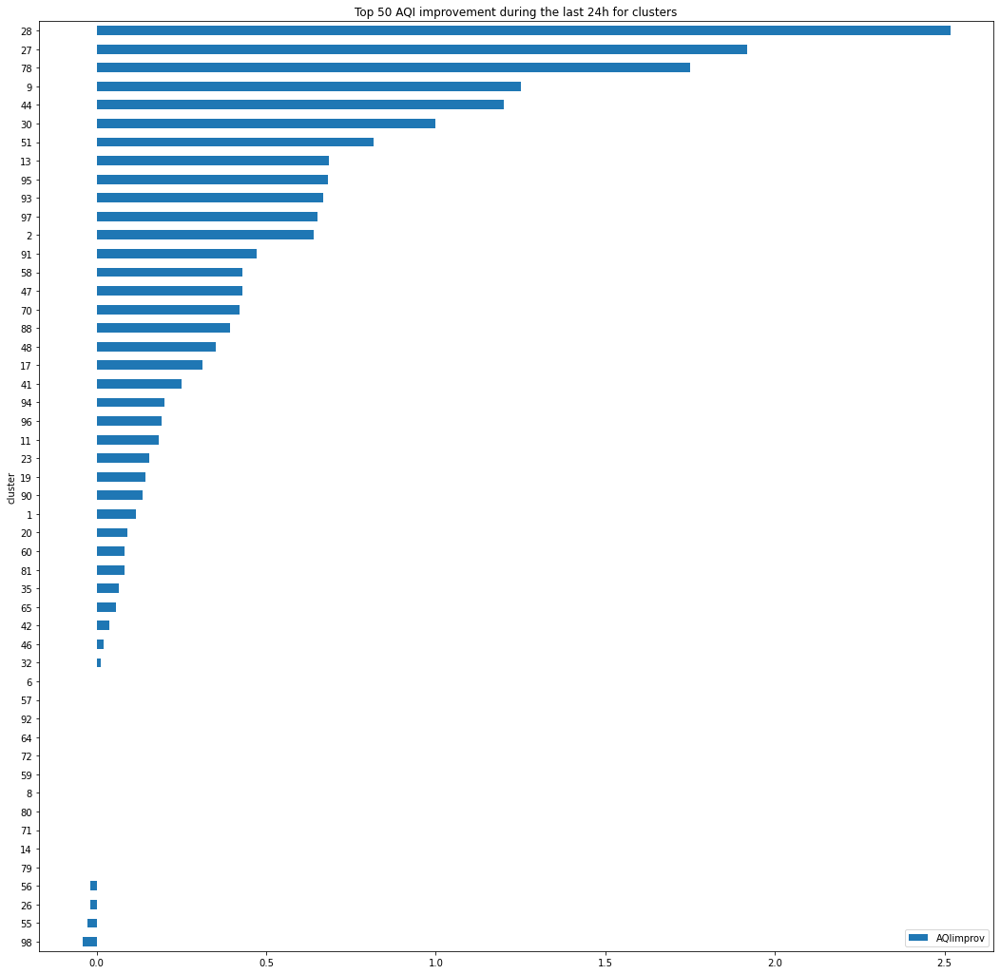

In [53]:
# Display the graph
top50['cluster'].astype(str)
ax=top50.plot.barh(x='cluster', figsize=(18,18))  
ax.invert_yaxis()
ax.set_title('Top 50 AQI improvement during the last 24h for clusters')

#### Top 50 improvement Map

In [54]:
# Creation of a Pandas dataframe containing the cluster center specifications
clusterDf = pd.DataFrame(model.clusterCenters(), columns = ["clust_center_latitude","clust_center_longitude"])
# Creation of the colum containing the cluster number
clusterDf['cluster'] = range(0, len(clusterDf))
# Convertion of the dataframe in Spark SQL dataframe
clusterDF = spark.createDataFrame(clusterDf) 
clusterDF = clusterDF.select("cluster","clust_center_longitude","clust_center_latitude")

/home/anthony/.local/lib/python3.10/site-packages/pyspark/sql/pandas/conversion.py:474: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, series in pdf.iteritems():
/home/anthony/.local/lib/python3.10/site-packages/pyspark/sql/pandas/conversion.py:486: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, series in pdf.iteritems():


In [55]:
# Apply of a join transformation to join the two dataframes by the same cluster
sensorsDF2 = sensorsDF2.join(clusterDF, on="cluster").orderBy(F.col("AQIimprov").desc())
sensorsDF2.show()

+-------+-------------------+----------------------+---------------------+
|cluster|          AQIimprov|clust_center_longitude|clust_center_latitude|
+-------+-------------------+----------------------+---------------------+
|     28|  2.517345399698341|     30.09583794659785|    50.84374960206403|
|     27| 1.9181308887191246|    16.900739159682807|    51.50925261184104|
|     78|               1.75|     85.55633482578001|          55.04678338|
|      9|               1.25|    29.124759046922502|      -26.51549182269|
|     44| 1.2000000000000002|     94.90212030044201|          55.69006402|
|     30|                1.0|       120.97788065672|       14.64799638229|
|     51|  0.816376714620275|     19.14330626330124|   50.248825823479685|
|     13| 0.6843172331544425|    13.453734103899377|    52.55356906796033|
|     95| 0.6833333333333336|     12.31762784738444|    54.47051402235002|
|     93|  0.667396838553076|    18.733156903830736|    53.74539531568262|
|     97| 0.6503496503496

In [56]:
sensorsDf2 = sensorsDF2.toPandas()
top50=sensorsDf2.head(50)

In [57]:
from branca.colormap import LinearColormap

m = folium.Map(tiles='cartodbpositron')

color_scale = LinearColormap(['#e9f2e9','#047000'], vmin = 0, vmax = 4)

for index ,row in top50.iterrows():
    folium.CircleMarker(
        radius=10,
        location=[row["clust_center_latitude"], row["clust_center_longitude"]],
        color=color_scale(row["AQIimprov"]),
        fill_color=color_scale(row["AQIimprov"]),
        fill_opacity=0.9,
        tooltip=int(row["cluster"]),
    ).add_to(m)
    

# Display the map
m

### Display the zone of each cluster

In [58]:
sensorsDf2test = sensorsDF2test.toPandas()

In [59]:
from branca.colormap import LinearColormap

m = folium.Map(tiles='cartodbpositron')

clusterNumber = 0

color_scale = LinearColormap(['yellow', 'blue','red', 'green'], vmin = 0, vmax = 100)

# Add points to the map
for array in model.clusterCenters():
    Marker([array[0], array[1]],
           tooltip=clusterNumber).add_to(m)
    clusterNumber += 1

for index ,row in sensorsDf2test.iterrows():
    folium.Circle(
        radius=2,
        location=[row["latitude"], row["longitude"]],
        color=color_scale(row["cluster"]),
        fill=False,
    ).add_to(m)
    

# Display the map
m

# 3. Longest streaks of good air quality 


In [60]:
sensorsDF3 = sensorsDF2temp

In [61]:
sensorsDF3.show()

+--------+---------+-----+----------+---+-------+---------------+-------+
|latitude|longitude|   id|      date|AQI|country|GeocCoordinates|cluster|
+--------+---------+-----+----------+---+-------+---------------+-------+
|  48.838|    2.322|  819|2022-11-15|  1|    FRA| [48.838,2.322]|     45|
|  51.114|    6.542| 1404|2022-11-15|  1|    DEU| [51.114,6.542]|     25|
|  51.664|    7.626| 2362|2022-11-15|  1|    DEU| [51.664,7.626]|     25|
|  51.728|    8.794| 4506|2022-11-15| 10|    DEU| [51.728,8.794]|     31|
|  48.768|    9.154| 4837|2022-11-15|  1|    DEU| [48.768,9.154]|     10|
|   49.36|    8.266| 6640|2022-11-15|  1|    DEU|  [49.36,8.266]|     10|
|  52.284|    8.032| 7621|2022-11-15|  1|    DEU| [52.284,8.032]|     31|
|  48.678|     9.28| 8708|2022-11-15|  1|    DEU|  [48.678,9.28]|     10|
|  48.024|   11.726| 9536|2022-11-15|  1|    DEU|[48.024,11.726]|     46|
|   53.56|   10.062| 9972|2022-11-15|  2|    DEU| [53.56,10.062]|     37|
|  51.146|    7.008|12306|2022-11-15| 

#### Computing of the average AQI per cluster per day and added of a new column of 1 if this average is considered as good (under 3) 

In [62]:
sensorsDF3 = sensorsDF3.groupBy("cluster","date") \
                       .agg(F.avg("AQI")) \
                       .orderBy("cluster", "date") \
                       .withColumn("LowIndex", F.when(F.col("avg(AQI)") <= 3, 1).otherwise(0))

In [63]:
sensorsDF3.show()

+-------+----------+------------------+--------+
|cluster|      date|          avg(AQI)|LowIndex|
+-------+----------+------------------+--------+
|      0|2022-11-06|               3.0|       1|
|      0|2022-11-07| 1.270735524256651|       1|
|      0|2022-11-08|1.2076069730586372|       1|
|      0|2022-11-09|1.1974921630094044|       1|
|      0|2022-11-10|1.6080870917573873|       1|
|      0|2022-11-11|            1.8375|       1|
|      0|2022-11-12|2.7972136222910216|       1|
|      0|2022-11-13|2.0460122699386503|       1|
|      0|2022-11-14| 3.158385093167702|       0|
|      0|2022-11-15|2.4937694704049846|       1|
|      0|2022-11-16|1.3810264385692068|       1|
|      0|2022-11-17|         1.7515625|       1|
|      0|2022-11-18|2.0204724409448818|       1|
|      0|2022-11-19| 1.478740157480315|       1|
|      0|2022-11-20|1.8338557993730407|       1|
|      0|2022-11-21|2.6180665610142633|       1|
|      0|2022-11-22|            2.9312|       1|
|      0|2022-11-23|

### Computing the streak of 0 and 1

In [64]:
from pyspark.sql import Window 
from pyspark.sql import functions as f
#Windows definition

w1 = Window.partitionBy(sensorsDF3.cluster).orderBy(sensorsDF3.date)
w2 = Window.partitionBy(sensorsDF3.cluster,sensorsDF3.LowIndex).orderBy(sensorsDF3.date)


res = sensorsDF3.withColumn('LowIndex1', F.lead("LowIndex",1).over(w1)) \
                .withColumn('grp',f.row_number().over(w1)-f.row_number().over(w2)) 

#Window definition for streak
w3 = Window.partitionBy(res.cluster,res.LowIndex,res.grp).orderBy(res.date)

sensorsDF3 = res.withColumn('streak_1',f.when((res.LowIndex == 0) | (res.LowIndex == res.LowIndex1),0).otherwise(f.row_number().over(w3)))
                           
sensorsDF3.show()

+-------+----------+------------------+--------+---------+---+--------+
|cluster|      date|          avg(AQI)|LowIndex|LowIndex1|grp|streak_1|
+-------+----------+------------------+--------+---------+---+--------+
|      0|2022-11-14| 3.158385093167702|       0|        1|  8|       0|
|      0|2022-11-06|               3.0|       1|        1|  0|       0|
|      0|2022-11-07| 1.270735524256651|       1|        1|  0|       0|
|      0|2022-11-08|1.2076069730586372|       1|        1|  0|       0|
|      0|2022-11-09|1.1974921630094044|       1|        1|  0|       0|
|      0|2022-11-10|1.6080870917573873|       1|        1|  0|       0|
|      0|2022-11-11|            1.8375|       1|        1|  0|       0|
|      0|2022-11-12|2.7972136222910216|       1|        1|  0|       0|
|      0|2022-11-13|2.0460122699386503|       1|        0|  0|       8|
|      0|2022-11-15|2.4937694704049846|       1|        1|  1|       0|
|      0|2022-11-16|1.3810264385692068|       1|        1|  1|  

### Ranking cluster by longest good air quality streak

In [65]:
sensorsDF3Max = sensorsDF3.groupBy("cluster") \
                       .agg(F.max("streak_1")) \
                       .orderBy(F.col("max(streak_1)").desc())

In [66]:
sensorsDF3Max.show()

+-------+-------------+
|cluster|max(streak_1)|
+-------+-------------+
|     46|           21|
|      1|           21|
|     10|           21|
|     68|           21|
|     86|           21|
|     96|           21|
|     52|           21|
|     25|           21|
|     56|           21|
|     32|           21|
|     63|           21|
|     66|           21|
|     42|           21|
|     23|           20|
|     24|           20|
|      4|           20|
|     26|           20|
|      9|           20|
|      2|           20|
|     29|           20|
+-------+-------------+
only showing top 20 rows



### Resume of the streaks per cluster

In [67]:
sensorsDF3Count = sensorsDF3.filter(sensorsDF3.streak_1 != 0) \
                            .groupBy("cluster", "streak_1") \
                            .agg(F.count("streak_1")) 

In [68]:
sensorsDF3Count.show()

+-------+--------+---------------+
|cluster|streak_1|count(streak_1)|
+-------+--------+---------------+
|      0|       8|              1|
|      0|      12|              1|
|      1|      21|              1|
|      2|      20|              1|
|      3|       5|              1|
|      3|       2|              1|
|      3|       1|              1|
|      3|       9|              1|
|      4|      20|              1|
|      5|      12|              1|
|      5|       4|              1|
|      5|       1|              1|
|      6|      20|              1|
|      7|       8|              1|
|      7|      12|              1|
|      8|      20|              1|
|      9|      20|              1|
|     10|      21|              1|
|     11|      20|              1|
|     12|      20|              1|
+-------+--------+---------------+
only showing top 20 rows



In [69]:
sensorsDf3Count = sensorsDF3Count.toPandas()
allClusterStreak = sensorsDf3Count["streak_1"]
clusterStreak = sensorsDf3Count.loc[sensorsDf3Count['cluster'] == 10]
clusterStreak = clusterStreak.set_index("streak_1")

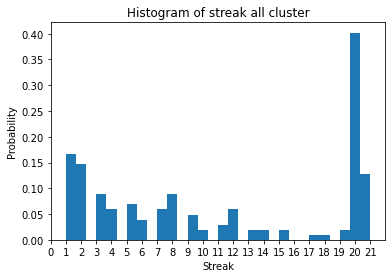

In [70]:
plt.hist(allClusterStreak, density=True, bins=30)  # density=False would make counts
plt.ylabel('Probability')
plt.xlabel('Streak')
plt.xticks(range(0,22));
plt.title('Histogram of streak all cluster');

In [71]:
cluster_number = 10
clusterHist = sensorsDf3Count.loc[sensorsDf3Count['cluster'] == cluster_number]

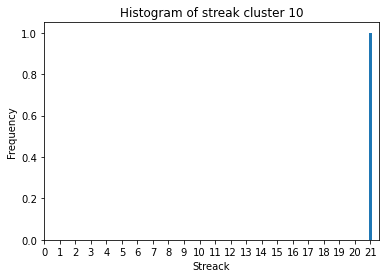

In [72]:
plt.hist(clusterHist["streak_1"], density=False, bins=5) 
plt.ylabel('Frequency')
plt.xlabel('Streack')
plt.xticks(range(0,22))
plt.title('Histogram of streak cluster ' + str(cluster_number));

In [73]:
sensorsDF3Count = sensorsDF3Count.join(clusterDF, on="cluster")

In [74]:
len(model.clusterCenters())

100

In [75]:
import altair as alt
import pandas as pd

clusterNumber = 0

# create folium map
start_coords = [0, 0]
m = folium.Map(
    location=start_coords,
    zoom_start=2,
)

clusterNumber = 0

# Add points to the map
for array in model.clusterCenters():
    
    clusterHist = sensorsDf3Count.loc[sensorsDf3Count['cluster'] == clusterNumber]
    
    buckerNumberMax = 22
    arrayFinal = np.array([1,1])

    i = 0
    while i<=buckerNumberMax:
        try:
            count = clusterHist.loc[clusterHist['streak_1'] == i, 'count(streak_1)'].iloc[0]
        except:
            count = 0 
    
        arrayTemp=[i, count]
        arrayFinal = np.vstack([arrayFinal, arrayTemp])
        i+=1

    arrayFinal = np.delete(arrayFinal, 0,0)
    histCluster = pd.DataFrame(arrayFinal, columns=["streak_1","count"]) 
    
    # create an altair chart, then convert to JSON
    chart = alt.Chart(histCluster).mark_bar().encode(x='streak_1', y='count')
    vis1 = chart.to_json()
    
    Marker([array[0], array[1]],
           tooltip=clusterNumber,
           popup=folium.Popup(max_width=400).add_child(folium.VegaLite(vis1, width=400, height=300))).add_to(m)
    
  
    clusterNumber += 1

m

/home/anthony/.local/lib/python3.10/site-packages/altair/utils/core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():
/home/anthony/.local/lib/python3.10/site-packages/altair/utils/core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():
/home/anthony/.local/lib/python3.10/site-packages/altair/utils/core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():
/home/anthony/.local/lib/python3.10/site-packages/altair/utils/core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():
/home/anthony/.local/lib/python3.10/site-packages/altair/utils/core.py:317: FutureWarning: iteritems is 

### Histogram of streaks per cluster based on individual sensors

In [76]:
# Selecting datas by using an SQL expression 
sensorsDF4 = sensorsDF

In [77]:
from pyspark.ml.feature import VectorAssembler

# We create a vector containing latitude and longitude using by the K-means algorithm
assembler = VectorAssembler().setInputCols(['latitude','longitude']).setOutputCol("GeocCoordinates")

# Add feature column to dataset
sensorsDF4 = assembler.transform(sensorsDF4)

# Apply model 
sensorsDF4 = model.transform(sensorsDF4)

In [78]:
sensorsDF4 = sensorsDF4.groupBy("id","date", "cluster") \
                       .agg(F.avg("AQI")) \
                       .orderBy("cluster", "date") \
                       .withColumn("LowIndex", F.when(F.col("avg(AQI)") <= 3, 1).otherwise(0))

In [79]:
from pyspark.sql import Window 
from pyspark.sql import functions as f
#Windows definition

w1 = Window.partitionBy(sensorsDF4.cluster, sensorsDF4.id).orderBy(sensorsDF4.date)
w2 = Window.partitionBy(sensorsDF4.cluster, sensorsDF4.id,sensorsDF4.LowIndex).orderBy(sensorsDF4.date)


res = sensorsDF4.withColumn('LowIndex1', F.lead("LowIndex",1).over(w1)) \
                .withColumn('grp',f.row_number().over(w1)-f.row_number().over(w2)) 

#Window definition for streak
w3 = Window.partitionBy(res.cluster,sensorsDF4.id, res.LowIndex,res.grp).orderBy(res.date)

sensorsDF4 = res.withColumn('streak_1',f.when((res.LowIndex == 0) | (res.LowIndex == res.LowIndex1),0).otherwise(f.row_number().over(w3)))

In [80]:
sensorsDF4 = sensorsDF4.groupBy("id", "cluster") \
                       .agg(F.max("streak_1")) \
                       .orderBy("cluster")

In [81]:
sensorsDf4 = sensorsDF4.toPandas()

In [82]:
sensorsDf4 = sensorsDf4.loc[sensorsDf4['cluster'] == 1]

array([[<AxesSubplot:title={'center':'max(streak_1)'}>]], dtype=object)

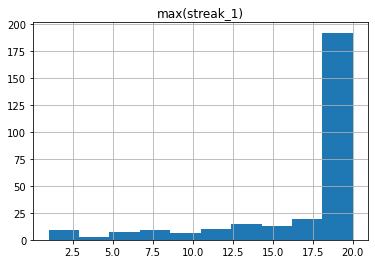

In [83]:
sensorsDf4.hist(column='max(streak_1)')

In [ ]:
spark.stop()